In [1]:
from http.client import HTTPSConnection
from base64 import b64encode
import pandas as pd
import requests 
import folium 


In [2]:
data = pd.read_csv("DataSets/noDTU2", encoding = "ISO-8859-1") 
data

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type
0,00:30:44:1c:35:2f,IBR600-52f,[WPA-PSK-CCMP][WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:24:15,11,-82,55.786276,12.521116,87.082275,3.216,WIFI
1,14:d6:4d:4b:00:46,VET-AP,[WPA-PSK-CCMP+TKIP][WPA2-PSK-CCMP+TKIP][ESS][WPS],2018-06-07 12:25:24,11,-77,55.786231,12.521193,80.832520,3.216,WIFI
2,00:78:88:99:65:7b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 12:25:42,36,-86,55.786235,12.521208,81.856201,3.216,WIFI
3,30:74:96:6c:29:b4,HUAWEI P10 lite,[WPA2-PSK-CCMP][ESS],2018-06-07 12:25:49,1,-76,55.786216,12.521232,82.698853,3.216,WIFI
4,42:b8:9a:8a:2a:7b,DIRECT-7b-HP M477 LaserJet,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:25:49,1,-79,55.786216,12.521232,82.698853,3.216,WIFI
...,...,...,...,...,...,...,...,...,...,...,...
5069,00:78:88:aa:c0:8b,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,132,-86,55.783617,12.517039,79.070408,64.000,WIFI
5070,04:62:73:fe:a8:64,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:42,1,-84,55.783617,12.517039,79.070408,64.000,WIFI
5071,e8:65:49:11:23:eb,NaN,[WPA2-EAP-CCMP][ESS],2018-06-07 13:40:48,44,-67,55.783617,12.517039,79.019761,64.000,WIFI
5072,3a:ca:da:a1:1b:9e,Hans Jakobs iPhone,[WPA2-PSK-CCMP][ESS],2018-06-07 13:40:48,1,-98,55.783617,12.517039,79.019761,64.000,WIFI


In [3]:
wlan_map = folium.Map(
            #tiles='Stamen Toner'
        )
for index,result in data.iterrows():
    tooltip = str(result.SSID)+" - "+str(result.MAC)
    """folium.Marker([result.CurrentLatitude, result.CurrentLongitude],
                  popup=(str(result.SSID)),
                  icon=folium.Icon(color='purple', icon='wifi'),
                  tooltip=tooltip).add_to(wlan_map)"""
    folium.Circle(
        radius=3,
        location=[result.CurrentLatitude, result.CurrentLongitude],
        popup=(str(result.MAC)),
        color='purple',
        fill=True,
        tooltip=(str(result.SSID))
    ).add_to(wlan_map)

sw = data[['CurrentLatitude', 'CurrentLongitude']].min().values.tolist()
ne = data[['CurrentLatitude', 'CurrentLongitude']].max().values.tolist()
wlan_map.fit_bounds([sw, ne]) 
display(wlan_map)

In [4]:
mac_data = pd.read_csv("DataSets/macaddress.io-db.csv", encoding = "ISO-8859-1") 
mac_data


,oui,isPrivate,companyName,companyAddress,countryCode,assignmentBlockSize,dateCreated,dateUpdated
0,60:64:A1,0,RADiflow Ltd,31 Habarzel St. Tel Aviv 6971045 IL,IL,MA-L,2013-07-29,2015-09-27
1,70:B3:D5:61:C,0,Earth Works,13-21 Saiwaityou Kofu Yamanashi 400-0857 JP,JP,MA-S,2016-12-27,2016-12-27
2,2C:B8:ED,0,Sonicwall,5455 Great America Parkway Santa Clara CA 9505...,US,MA-L,2017-12-28,2017-12-28
3,00:10:CD,0,Interface Concept,3 VENELLE de KERGOS 29000 QUIMPER FR,FR,MA-L,1997-11-14,2015-09-27
4,00:D0:E0,0,Dooin Electronics Co,"DOOIN BLDG. 16-6, SOONAE-DONG KOREA 463-020 KR",KR,MA-L,2000-11-09,2015-09-27
...,...,...,...,...,...,...,...,...
39834,8C:5F:DF,0,Beijing Railway Signal Factory,"No.2 Sicun Xilu Langfa,Huangcun, Beiijng 10261...",CN,MA-L,2011-03-17,2015-09-27
39835,84:25:DB,0,"Samsung Electronics Co, Ltd","#94-1,Imsoo-Dong Gumi Gyeongbuk 730-350 KR",KR,MA-L,2011-11-26,2015-09-27
39836,00:03:5C,0,Saint Song Corp,"4F, No. 12, Lane 94, Tsao Ti Wzi 222 TW",TW,MA-L,2000-11-09,2015-09-27
39837,00:13:4D,0,Inepro BV,Pondweg 7 Nieuw- Vennep NL,NL,MA-L,2005-01-23,2015-09-27


In [5]:
"""import csv
import itertools
import multiprocessing

mac_vendors = pd.DataFrame(columns=['mac','vendor'])
#for row in input_file:
    #print(row)

#for index,ap in data.iterrows():
    #print(ap.MAC)
def f(data):
    for index,ap in data.iterrows():
        #print(str(ap.MAC).upper())
        input_file = csv.DictReader(open("DataSets/macaddress.io-db.csv"))
        for mac_add in input_file:
            #print(str(mac_add["oui"]).upper())
            if str(mac_add["oui"]).upper() in str(ap.MAC).upper():
                print(str(ap.SSID)+" - "+str(ap.MAC)+" - "+str(mac_add["oui"])+" - "+str(mac_add["companyName"]))
                mac_vendors.loc[index] = pd.Series({'mac':ap.MAC,'oui':mac_add["oui"],'vendor':mac_add["companyName"]})
                break

#paramlist = list(itertools.product(data))
#pool = multiprocessing.Pool()
f(data)
mac_vendors.to_csv('DataSets/mac_vendors.csv')
mac_vendors
"""


            


'import csv\nimport itertools\nimport multiprocessing\n\nmac_vendors = pd.DataFrame(columns=[\'mac\',\'vendor\'])\n#for row in input_file:\n    #print(row)\n\n#for index,ap in data.iterrows():\n    #print(ap.MAC)\ndef f(data):\n    for index,ap in data.iterrows():\n        #print(str(ap.MAC).upper())\n        input_file = csv.DictReader(open("DataSets/macaddress.io-db.csv"))\n        for mac_add in input_file:\n            #print(str(mac_add["oui"]).upper())\n            if str(mac_add["oui"]).upper() in str(ap.MAC).upper():\n                print(str(ap.SSID)+" - "+str(ap.MAC)+" - "+str(mac_add["oui"])+" - "+str(mac_add["companyName"]))\n                mac_vendors.loc[index] = pd.Series({\'mac\':ap.MAC,\'oui\':mac_add["oui"],\'vendor\':mac_add["companyName"]})\n                break\n\n#paramlist = list(itertools.product(data))\n#pool = multiprocessing.Pool()\nf(data)\nmac_vendors.to_csv(\'DataSets/mac_vendors.csv\')\nmac_vendors\n'

In [6]:
mac_vendors = pd.read_csv("DataSets/mac_vendors.csv", encoding = "ISO-8859-1") 
df_final = data.merge(mac_vendors, left_on='MAC', right_on='mac')
df_final.drop_duplicates(subset ="MAC",keep = "first", inplace = True) 
df_final = df_final[df_final['SSID'].notna()]
df_final.to_csv('DataSets/mac_vendors_clean.csv')
df_final

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
0,00:30:44:1c:35:2f,IBR600-52f,[WPA-PSK-CCMP][WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:24:15,11,-82,55.786276,12.521116,87.082275,3.216,WIFI,0,00:30:44:1c:35:2f,"CradlePoint, Inc"
9,14:d6:4d:4b:00:46,VET-AP,[WPA-PSK-CCMP+TKIP][WPA2-PSK-CCMP+TKIP][ESS][WPS],2018-06-07 12:25:24,11,-77,55.786231,12.521193,80.832520,3.216,WIFI,1,14:d6:4d:4b:00:46,D-Link International
35,30:74:96:6c:29:b4,HUAWEI P10 lite,[WPA2-PSK-CCMP][ESS],2018-06-07 12:25:49,1,-76,55.786216,12.521232,82.698853,3.216,WIFI,3,30:74:96:6c:29:b4,"Huawei Tech Co, Ltd"
43,18:33:9d:8d:bf:e1,DC_Guest,[ESS],2018-06-07 12:26:50,1,-81,55.786043,12.521679,83.387390,3.216,WIFI,7,18:33:9d:8d:bf:e1,"Cisco Systems, Inc"
44,18:33:9d:8d:bf:e0,DC_NET,[WPA2-EAP-CCMP][ESS],2018-06-07 12:26:54,1,-80,55.786045,12.521759,84.628723,3.216,WIFI,9,18:33:9d:8d:bf:e0,"Cisco Systems, Inc"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12722,e8:8d:28:5e:e1:46,Jan Madsen's Wi-Fi Network,[WPA2-PSK-CCMP][ESS],2018-06-07 13:38:35,100,-87,55.783303,12.518838,81.969704,8.000,WIFI,5034,e8:8d:28:5e:e1:46,"Apple, Inc"
12725,94:65:2d:d8:2e:16,dankweb,[WPA2-PSK-CCMP][ESS],2018-06-07 13:38:40,1,-92,55.783342,12.518538,82.155742,8.000,WIFI,5041,94:65:2d:d8:2e:16,"OnePlus Tech (Shenzhen) Co, Ltd"
12726,b8:27:eb:55:c6:8e,RobotHenrik,[WPA2-PSK-CCMP][ESS],2018-06-07 13:38:44,7,-91,55.783387,12.518306,82.312504,8.000,WIFI,5047,b8:27:eb:55:c6:8e,Raspberry Pi Foundation
12727,a4:4c:11:fd:e4:f0,kabelplus,[WPA2-EAP-CCMP][ESS],2018-06-07 13:38:44,4,-95,55.783387,12.518306,82.312504,8.000,WIFI,5048,a4:4c:11:fd:e4:f0,"Cisco Systems, Inc"


In [7]:
most_frequent_vendors = df_final['vendor'].value_counts()[:7]
most_frequent_vendors

Netgear                  204
D-Link International     158
TP-Link Tech Co, Ltd     155
Cisco Systems, Inc       141
ASUSTek Computer Inc     122
Hewlett Packard           70
Extreme Networks, Inc     59
Name: vendor, dtype: int64

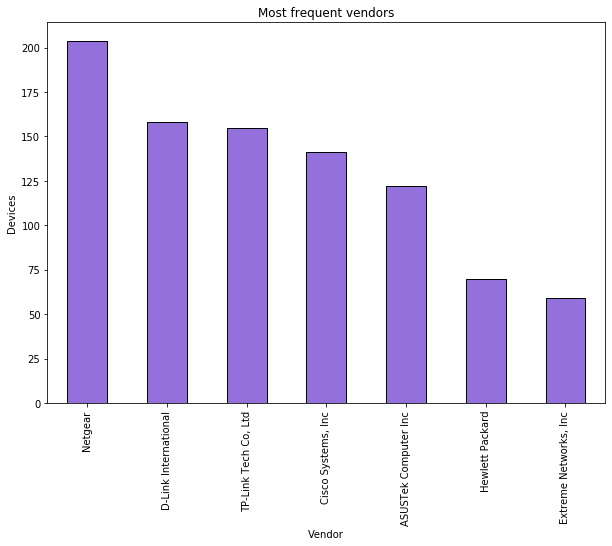

In [19]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt
import numpy as np



most_frequent_vendors.plot(kind='bar',figsize=(10,7), color="mediumpurple",edgecolor = "black")
plt.title('Most frequent vendors')
plt.xlabel('Vendor')
plt.ylabel('Devices')
plt.xticks(rotation=90)
plt.show()

In [9]:
wlan_processed_map = folium.Map()
for index,result in df_final.iterrows():
    tooltip = str(result.SSID)+" - "+str(result.MAC)
    """folium.Marker([result.CurrentLatitude, result.CurrentLongitude],
                  popup=(str(result.SSID)),
                  icon=folium.Icon(color='purple', icon='wifi'),
                  tooltip=tooltip).add_to(wlan_map)"""

    if "Cisco" in result.vendor:
        color = "cyan"
    elif "Netgear" in result.vendor:
        color = "green"
    elif "TP-Link" in result.vendor:
        color = "orange"
    elif "D-Link" in result.vendor:
        color = "white"
    elif "ASUSTek" in result.vendor:
        color = "blue"
    elif "Huawei" in result.vendor:
        color = "red"
    elif "Hewlett" in result.vendor:
        color = "black"
    else:
        color = "purple"
    
            
    folium.Circle(
        radius=5,
        location=[result.CurrentLatitude, result.CurrentLongitude],
        popup=(str(result.MAC)+" - "+str(result.SSID)),
        color=color,
        fill=True,
        tooltip=(str(result.SSID))
    ).add_to(wlan_processed_map)

sw = data[['CurrentLatitude', 'CurrentLongitude']].min().values.tolist()
ne = data[['CurrentLatitude', 'CurrentLongitude']].max().values.tolist()
wlan_processed_map.fit_bounds([sw, ne]) 
display(wlan_processed_map)

#https://www.itproportal.com/2015/05/20/millions-of-routers-vulnerable-to-stack-overflow-hack/

In [10]:
#https://hashcat.net/forum/thread-6170.html
df_final_zyxel = df_final[df_final['SSID'].str.contains("ZyXEL")]
df_final_zyxel

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
4036,1c:74:0d:c6:1d:31,ZyXEL_1D31,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:44:56,8,-79,55.788684,12.518206,74.071472,3.216,WIFI,1252,1c:74:0d:c6:1d:31,Zyxel Communications Corp
4268,b8:ec:a3:76:57:dd,ZyXEL7657DC,[WPA2-PSK-CCMP+TKIP][WPA-PSK-CCMP+TKIP][ESS],2018-06-07 13:48:20,13,-87,55.787391,12.516428,78.872131,4.288,WIFI,1351,b8:ec:a3:76:57:dd,Zyxel Communications Corp
5572,58:8b:f3:99:fc:30,ZyXEL_2.4G99FC30,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:33:41,13,-97,55.785820,12.515729,79.356507,6.000,WIFI,1993,58:8b:f3:99:fc:30,Zyxel Communications Corp
7041,10:7b:ef:db:05:15,ZyXEL,[WPA-PSK-TKIP][WPS][ESS],2018-06-07 12:41:20,1,-87,55.784644,12.514168,77.899363,6.000,WIFI,2486,10:7b:ef:db:05:15,Zyxel Communications Corp
10876,28:28:5d:fc:20:60,ZyXELFC2060,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:13:06,2,-90,55.779947,12.520599,83.632861,6.000,WIFI,3940,28:28:5d:fc:20:60,Zyxel Communications Corp
11037,10:7b:ef:ff:08:07,ZyXEL NBG-418N v2,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:14:51,2,-99,55.780691,12.522108,83.217909,6.000,WIFI,3966,10:7b:ef:ff:08:07,Zyxel Communications Corp
11201,50:67:f0:32:16:64,ZyXEL,[WPS][ESS],2018-06-07 13:15:37,7,-94,55.780347,12.523240,83.250741,8.000,WIFI,4042,50:67:f0:32:16:64,Zyxel Communications Corp
11327,fc:f5:28:d4:cc:b0,ZyXELD4CCB0,[WPA2-PSK-CCMP+TKIP][WPS][ESS],2018-06-07 13:15:55,11,-93,55.780772,12.523622,81.949152,8.000,WIFI,4123,fc:f5:28:d4:cc:b0,Zyxel Communications Corp
11454,e8:37:7a:87:52:e9,ZyXEL NBG-418N v2,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:16:07,2,-89,55.781115,12.523834,81.609919,6.000,WIFI,4178,e8:37:7a:87:52:e9,Zyxel Communications Corp
11576,00:23:f8:06:0c:13,ZyXEL,[WPA-PSK-TKIP][WPS][ESS],2018-06-07 13:16:11,1,-91,55.781207,12.523668,81.760439,6.000,WIFI,4217,00:23:f8:06:0c:13,Zyxel Communications Corp


In [11]:
df_final_hp = df_final[df_final['SSID'].str.contains("HP")]
df_final_hp

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
93,18:60:24:08:c1:f3,DIRECT-EF-HP OfficeJet Pro 8710,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:27:16,6,-87,55.786138,12.521928,84.485046,3.216000,WIFI,16,18:60:24:08:c1:f3,Hewlett Packard
1344,30:e1:71:49:75:3f,DIRECT-3E-HP ENVY 5640 series,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:51:41,6,-83,55.789893,12.525086,78.266418,3.216000,WIFI,257,30:e1:71:49:75:3f,Hewlett Packard
1437,ec:8e:b5:cb:ae:a9,DIRECT-94-HP OfficeJet Pro 8710,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:53:27,6,-85,55.788934,12.525833,81.798645,3.216000,WIFI,293,ec:8e:b5:cb:ae:a9,Hewlett Packard
4011,ec:8e:b5:cd:77:d3,DIRECT-33-HP OfficeJet Pro 8710,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:44:40,6,-80,55.788642,12.518509,73.495117,3.216000,WIFI,1237,ec:8e:b5:cd:77:d3,Hewlett Packard
4183,ec:8e:b5:b8:d1:47,DIRECT-46-HP ENVY 4520 series,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:47:42,6,-87,55.787440,12.517175,83.604797,9.648001,WIFI,1328,ec:8e:b5:b8:d1:47,Hewlett Packard
4296,30:e1:71:05:89:6c,DIRECT-6B-HP DeskJet 3630 series,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:48:25,6,-89,55.787319,12.516392,79.385376,4.288000,WIFI,1357,30:e1:71:05:89:6c,Hewlett Packard
7541,6c:c2:17:d8:87:5f,HP-Print-5F-Officejet Pro X476dw,[WPA2-PSK-CCMP][ESS],2018-06-07 12:43:10,11,-91,55.783925,12.514189,81.042937,6.000000,WIFI,2632,6c:c2:17:d8:87:5f,Hewlett Packard
8672,a4:5d:36:1b:92:9f,HP-Print-9F-ENVY 5530 series,[ESS],2018-06-07 12:51:54,11,-97,55.782819,12.513138,80.000712,6.000000,WIFI,2980,a4:5d:36:1b:92:9f,Hewlett Packard
8679,a4:5d:36:43:9c:88,HP-Print-88-Officejet Pro 8600,[WPA2-PSK-CCMP][ESS],2018-06-07 12:52:02,4,-91,55.782576,12.513021,80.005426,6.000000,WIFI,2992,a4:5d:36:43:9c:88,Hewlett Packard
9109,84:4b:f5:07:e2:9a,HP-Print-9a-LaserJet 400 M401dw,[ESS],2018-06-07 12:53:05,6,-86,55.782454,12.512174,82.081486,8.000000,WIFI,3121,84:4b:f5:07:e2:9a,"Hon Hai Precision Ind. Co, Ltd"


In [12]:
df_final_tp = df_final[df_final['SSID'].str.contains("TP-LINK")]
df_final_tp

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
4398,d4:6e:0e:3f:b7:72,TP-LINK_B773,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:48:59,11,-86,55.786790,12.516296,76.251648,5.360000,WIFI,1378,d4:6e:0e:3f:b7:72,"TP-Link Tech Co, Ltd"
4510,70:4f:57:c6:c5:84,TP-LINK_C584,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:49:14,6,-85,55.786623,12.516510,77.860657,9.648001,WIFI,1391,70:4f:57:c6:c5:84,"TP-Link Tech Co, Ltd"
5231,d4:6e:0e:e6:ab:52,TP-LINK_AB52,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:33:25,4,-66,55.785877,12.516174,79.860051,16.000000,WIFI,1934,d4:6e:0e:e6:ab:52,"TP-Link Tech Co, Ltd"
5540,50:c7:bf:23:99:90,TP-LINK_9990,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:33:33,4,-98,55.785876,12.515933,79.751430,6.000000,WIFI,1965,50:c7:bf:23:99:90,"TP-Link Tech Co, Ltd"
5544,d4:6e:0e:57:3d:d6,TP-LINK_3DD6,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:33:33,1,-99,55.785876,12.515933,79.751430,6.000000,WIFI,1966,d4:6e:0e:57:3d:d6,"TP-Link Tech Co, Ltd"
5577,50:c7:bf:23:92:fc,TP-LINK_92FC,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:33:46,9,-98,55.785817,12.515663,79.502058,6.000000,WIFI,2000,50:c7:bf:23:92:fc,"TP-Link Tech Co, Ltd"
5664,a4:2b:b0:e9:f7:8d,TP-LINK_F78D,[WPA2-PSK-CCMP][ESS],2018-06-07 12:34:31,1,-96,55.785731,12.515861,82.096862,6.000000,WIFI,2094,a4:2b:b0:e9:f7:8d,"TP-Link Tech Co, Ltd"
5910,a4:2b:b0:e9:f7:8c,TP-LINK_F78C_5G,[WPA2-PSK-CCMP][ESS],2018-06-07 12:39:52,44,-91,55.784952,12.516000,79.595089,8.000000,WIFI,2284,a4:2b:b0:e9:f7:8c,"TP-Link Tech Co, Ltd"
5973,50:c7:bf:c1:55:22,TP-LINK_5522,[WPA-PSK-CCMP][WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:39:56,8,-82,55.784962,12.515832,78.930336,8.000000,WIFI,2298,50:c7:bf:c1:55:22,"TP-Link Tech Co, Ltd"
5977,d4:6e:0e:b4:b8:1a,TP-LINK_B81A,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:39:56,10,-83,55.784962,12.515832,78.930336,8.000000,WIFI,2299,d4:6e:0e:b4:b8:1a,"TP-Link Tech Co, Ltd"


In [13]:
df_final_wep = df_final[df_final['AuthMode'].str.contains("WEP")]
df_final_wep

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
1070,00:23:33:2c:79:a0,Hempel-Wireless,[WEP][ESS],2018-06-07 12:42:02,1,-88,55.792030,12.525940,83.110962,3.216000,WIFI,127,00:23:33:2c:79:a0,"Cisco Systems, Inc"
1182,3c:47:11:b0:d4:79,HUAWEI-E5180-D477-S2,[WEP][ESS],2018-06-07 12:44:35,5,-86,55.792252,12.522303,76.523499,9.648001,WIFI,185,3c:47:11:b0:d4:79,"Huawei Tech Co, Ltd"
1184,3c:47:11:b0:d4:78,HUAWEI-E5180-D477-S1,[WEP][ESS],2018-06-07 12:44:35,5,-87,55.792252,12.522303,76.523499,9.648001,WIFI,187,3c:47:11:b0:d4:78,"Huawei Tech Co, Ltd"
1185,3c:47:11:b0:d4:7a,HUAWEI-E5180-D477-S3,[WEP][ESS],2018-06-07 12:44:35,5,-87,55.792252,12.522303,76.523499,9.648001,WIFI,188,3c:47:11:b0:d4:7a,"Huawei Tech Co, Ltd"
4407,00:26:5a:f9:98:50,Linguini,[WEP][ESS][WPS],2018-06-07 13:49:04,1,-81,55.786731,12.516351,77.997803,6.432000,WIFI,1379,00:26:5a:f9:98:50,D-Link Corp
5916,00:1a:2a:97:f7:3e,sriracha,[WEP][ESS],2018-06-07 12:39:52,1,-83,55.784952,12.516000,79.595089,8.000000,WIFI,2287,00:1a:2a:97:f7:3e,Arcadyan Tech Corp
7137,00:26:66:c5:f8:fc,6111,[WEP][ESS],2018-06-07 12:41:20,11,-88,55.784644,12.514168,77.899363,6.000000,WIFI,2492,00:26:66:c5:f8:fc,Efm Networks
10402,00:18:4d:8c:0d:26,NETGEARSMED,[WEP][ESS],2018-06-07 13:06:37,11,-98,55.784453,12.523272,85.162893,8.000000,WIFI,3792,00:18:4d:8c:0d:26,Netgear
10743,00:06:25:ff:c6:c2,linksys,[WEP][ESS],2018-06-07 13:08:16,11,-84,55.783773,12.522390,87.269979,6.000000,WIFI,3892,00:06:25:ff:c6:c2,"The Linksys Group, Inc"
11109,90:e6:ba:be:fd:db,Havudsigten,[WEP][ESS],2018-06-07 13:14:59,3,-94,55.780421,12.521930,84.664100,8.000000,WIFI,3985,90:e6:ba:be:fd:db,ASUSTek Computer Inc


In [14]:
#https://www.digitaltrends.com/computing/netgear-routers-suffer-password-vulnerability/
#https://cve.mitre.org/cgi-bin/cvename.cgi?name=CVE-2017-5521
df_final_net = df_final[df_final['SSID'].str.contains("NETGEAR")]
len(df_final_net)
df_final_net

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
1197,b0:39:56:8b:f7:6c,NETGEAR83,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 12:45:39,6,-88,55.791424,12.522208,73.540100,9.648001,WIFI,199,b0:39:56:8b:f7:6c,Netgear
2333,c0:ff:d4:bd:41:90,NETGEAR32,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:13:53,11,-87,55.786252,12.525138,80.407654,17.152000,WIFI,520,c0:ff:d4:bd:41:90,Netgear
4269,8c:3b:ad:13:94:f3,NETGEAR14,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:48:25,11,-86,55.787319,12.516392,79.385376,4.288000,WIFI,1354,8c:3b:ad:13:94:f3,Netgear
4502,9c:3d:cf:01:1a:82,NETGEAR55,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:49:09,6,-84,55.786683,12.516445,79.399475,4.288000,WIFI,1385,9c:3d:cf:01:1a:82,Netgear
4506,9c:3d:cf:01:1a:83,NETGEAR55-5G-1,[WPA2-PSK-CCMP][ESS][WPS],2018-06-07 13:49:09,100,-86,55.786683,12.516445,79.399475,4.288000,WIFI,1386,9c:3d:cf:01:1a:83,Netgear
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12426,10:0d:7f:63:9d:0c,NETGEAR87,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:18:14,3,-92,55.783394,12.524730,78.203020,12.000000,WIFI,4768,10:0d:7f:63:9d:0c,Netgear
12467,a0:63:91:78:5d:18,NETGEAR64,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:18:18,12,-89,55.783498,12.524755,78.400266,8.000000,WIFI,4787,a0:63:91:78:5d:18,Netgear
12476,a0:63:91:78:5d:b6,NETGEAR 2.4 GHz,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:18:18,4,-92,55.783498,12.524755,78.400266,8.000000,WIFI,4792,a0:63:91:78:5d:b6,Netgear
12515,08:02:8e:99:e1:ca,NETGEAR47,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:18:22,11,-92,55.783611,12.524827,78.506977,6.000000,WIFI,4824,08:02:8e:99:e1:ca,Netgear


In [15]:
#https://linustechtips.com/main/topic/636155-port-forwarding-with-2-routers/
df_final_net_R8500 = df_final[df_final['SSID'].str.contains("NETGEAR") & df_final['MAC'].str.contains("2c:30:33")]
df_final_net_R8500

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
11228,2c:30:33:29:b6:70,NETGEAR41,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:15:46,13,-91,55.780456,12.523455,82.442152,6.0,WIFI,4067,2c:30:33:29:b6:70,Netgear
12128,2c:30:33:33:ce:ac,NETGEAR20-5G,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:17:42,36,-90,55.782510,12.524106,79.747140,8.0,WIFI,4557,2c:30:33:33:ce:ac,Netgear
12188,2c:30:33:33:ce:a8,NETGEAR20,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:17:46,1,-81,55.782602,12.524089,79.273086,6.0,WIFI,4570,2c:30:33:33:ce:a8,Netgear
12656,2c:30:33:33:cc:60,NETGEAR15,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:20:59,13,-89,55.784407,12.525030,80.422846,6.0,WIFI,4927,2c:30:33:33:cc:60,Netgear


In [16]:
#https://community.netgear.com/t5/Nighthawk-WiFi-Routers/Nighthawk-R8300-X6-Drop-Connection/m-p/1301260?lightbox-message-images-1370386=19938i53581E35EDBF152C
df_final_net_R8300 = df_final[df_final['SSID'].str.contains("NETGEAR") & df_final['MAC'].str.contains("10:da:43")]
df_final_net_R8300

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
5527,10:da:43:1c:96:d3,NETGEAR78,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 12:33:33,1,-98,55.785876,12.515933,79.751430,6.0,WIFI,1963,10:da:43:1c:96:d3,Netgear
11713,10:da:43:1c:a7:bf,NETGEAR15,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:16:53,4,-84,55.781372,12.523416,81.476596,6.0,WIFI,4300,10:da:43:1c:a7:bf,Netgear
11889,10:da:43:08:e0:66,NETGEAR90,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:17:18,4,-82,55.781877,12.523953,81.274205,4.0,WIFI,4434,10:da:43:08:e0:66,Netgear


In [17]:
#https://kb.netgear.com/19844/Why-does-my-Xbox-say-NAT-is-set-to-strict-or-moderate-when-I-try-to-play-online
df_final_net_R7000 = df_final[df_final['SSID'].str.contains("NETGEAR") & df_final['MAC'].str.contains("c4:04:15")]
df_final_net_R7000

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor


In [18]:
#https://kb.netgear.com/29923/Changing-the-DST-network-encryption-key
df_final_net_R7300 = df_final[df_final['SSID'].str.contains("NETGEAR") & df_final['MAC'].str.contains("a0:63:91")]
df_final_net_R7300

,MAC,SSID,AuthMode,FirstSeen,Channel,RSSI,CurrentLatitude,CurrentLongitude,AltitudeMeters,AccuracyMeters,Type,Unnamed: 0,mac,vendor
11333,a0:63:91:bd:e7:54,NETGEAR18,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:15:55,4,-95,55.780772,12.523622,81.949152,8.0,WIFI,4126,a0:63:91:bd:e7:54,Netgear
11552,a0:63:91:bd:e9:fa,NETGEAR79,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:16:11,4,-87,55.781207,12.523668,81.760439,6.0,WIFI,4210,a0:63:91:bd:e9:fa,Netgear
12467,a0:63:91:78:5d:18,NETGEAR64,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:18:18,12,-89,55.783498,12.524755,78.400266,8.0,WIFI,4787,a0:63:91:78:5d:18,Netgear
12476,a0:63:91:78:5d:b6,NETGEAR 2.4 GHz,[WPA2-PSK-CCMP][WPS][ESS],2018-06-07 13:18:18,4,-92,55.783498,12.524755,78.400266,8.0,WIFI,4792,a0:63:91:78:5d:b6,Netgear
